In [1]:
from mmdet.apis import init_detector, inference_detector
import math
import cv2
import matplotlib.pyplot as plt
import numpy as np
import tqdm
import matplotlib.colors as mcolors
from pycocotools.coco import COCO

In [10]:
config = 'configs/coco_tood.py'
checkpoint = 'checkpoints/tood_r101_fpn_dconv_c3-c5_mstrain_2x_coco_20211210_213728-4a824142.pth'
device = 'cuda:0'

In [11]:
model = init_detector(config, checkpoint, device)

2022-08-11 15:29:46,856 - root - INFO - ModulatedDeformConvPack backbone.layer2.0.conv2 is upgraded to version 2.
2022-08-11 15:29:46,858 - root - INFO - ModulatedDeformConvPack backbone.layer2.1.conv2 is upgraded to version 2.
2022-08-11 15:29:46,861 - root - INFO - ModulatedDeformConvPack backbone.layer2.2.conv2 is upgraded to version 2.
2022-08-11 15:29:46,863 - root - INFO - ModulatedDeformConvPack backbone.layer2.3.conv2 is upgraded to version 2.
2022-08-11 15:29:46,866 - root - INFO - ModulatedDeformConvPack backbone.layer3.0.conv2 is upgraded to version 2.
2022-08-11 15:29:46,869 - root - INFO - ModulatedDeformConvPack backbone.layer3.1.conv2 is upgraded to version 2.
2022-08-11 15:29:46,872 - root - INFO - ModulatedDeformConvPack backbone.layer3.2.conv2 is upgraded to version 2.
2022-08-11 15:29:46,874 - root - INFO - ModulatedDeformConvPack backbone.layer3.3.conv2 is upgraded to version 2.
2022-08-11 15:29:46,876 - root - INFO - ModulatedDeformConvPack backbone.layer3.4.conv2 

load checkpoint from local path: checkpoints/tood_r101_fpn_dconv_c3-c5_mstrain_2x_coco_20211210_213728-4a824142.pth


In [108]:
PALETTE = [(220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230),
               (106, 0, 228), (0, 60, 100), (0, 80, 100), (0, 0, 70),
               (0, 0, 192), (250, 170, 30), (100, 170, 30), (220, 220, 0),
               (175, 116, 175), (250, 0, 30), (165, 42, 42), (255, 77, 255),
               (0, 226, 252), (182, 182, 255), (0, 82, 0), (120, 166, 157),
               (110, 76, 0), (174, 57, 255), (199, 100, 0), (72, 0, 118),
               (255, 179, 240), (0, 125, 92), (209, 0, 151), (188, 208, 182),
               (0, 220, 176), (255, 99, 164), (92, 0, 73), (133, 129, 255),
               (78, 180, 255), (0, 228, 0), (174, 255, 243), (45, 89, 255),
               (134, 134, 103), (145, 148, 174), (255, 208, 186),
               (197, 226, 255), (171, 134, 1), (109, 63, 54), (207, 138, 255),
               (151, 0, 95), (9, 80, 61), (84, 105, 51), (74, 65, 105),
               (166, 196, 102), (208, 195, 210), (255, 109, 65), (0, 143, 149),
               (179, 0, 194), (209, 99, 106), (5, 121, 0), (227, 255, 205),
               (147, 186, 208), (153, 69, 1), (3, 95, 161), (163, 255, 0),
               (119, 0, 170), (0, 182, 199), (0, 165, 120), (183, 130, 88),
               (95, 32, 0), (130, 114, 135), (110, 129, 133), (166, 74, 118),
               (219, 142, 185), (79, 210, 114), (178, 90, 62), (65, 70, 15),
               (127, 167, 115), (59, 105, 106), (142, 108, 45), (196, 172, 0),
               (95, 54, 80), (128, 76, 255), (201, 57, 1), (246, 0, 122),
               (191, 162, 208)]
cat_ids = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 31, 32, 33,
           34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
           62, 63, 64, 65, 67, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90]

color_dict = {cat:col for cat,col in zip(cat_ids, PALETTE)}
id_dict = {cat:i for i, cat in enumerate(cat_ids)}
id_dict_inv = {i:cat for i, cat in enumerate(cat_ids)}

cmaps = []
for ic in range(len(PALETTE)):
    colors = [(PALETTE[ic][0], PALETTE[ic][1], PALETTE[ic][2], c) for c in np.linspace(0,1,100)]
    cmaps.append( mcolors.LinearSegmentedColormap.from_list(f'mycmap{ic}', colors, N=5) )

In [12]:
def generate_mask(image_size, grid_size, prob_thresh):
    image_w, image_h = image_size
    grid_w, grid_h = grid_size
    cell_w, cell_h = math.ceil(image_w / grid_w), math.ceil(image_h / grid_h)
    up_w, up_h = (grid_w + 1) * cell_w, (grid_h + 1) * cell_h

    mask = (np.random.uniform(0, 1, size=(grid_h, grid_w)) <
            prob_thresh).astype(np.float32)
    mask = cv2.resize(mask, (up_w, up_h), interpolation=cv2.INTER_LINEAR)
    offset_w = np.random.randint(0, cell_w)
    offset_h = np.random.randint(0, cell_h)
    mask = mask[offset_h:offset_h + image_h, offset_w:offset_w + image_w]
    return mask

In [13]:
def mask_image(image, mask):
    masked = ((image.astype(np.float32) / 255 * np.dstack([mask] * 3)) *
              255).astype(np.uint8)
    return masked

In [14]:
def iou(boxes, box):
    box = np.asarray(box)
    tl = np.maximum(boxes[:,:2], box[:2])
    br = np.minimum(boxes[:,2:], box[2:])
    intersection = np.prod(br - tl, axis=1) * np.all(tl < br, axis=1).astype(float)
    area1 = np.prod(boxes[:,2:] - boxes[:,:2], axis=1)
    area2 = np.prod(box[2:] - box[:2])
    return intersection / (area1 + area2 - intersection)

In [15]:
def generate_saliency_map(image,
                          n_classes,
                          target_boxes,
                          prob_thresh=0.5,
                          grid_size=(16, 16),
                          n_masks=5000,
                          seed=0):
    np.random.seed(seed)
    image_h, image_w = image.shape[:2]
    res = [
            [np.zeros((image_h, image_w), dtype=np.float32) for _ in range (len(target_boxes[ic]))]
            for ic in range(n_classes)
    ]
    for i in tqdm.notebook.tqdm(range(n_masks)):
        mask = generate_mask(image_size=(image_w, image_h),
                             grid_size=grid_size,
                             prob_thresh=prob_thresh)
        masked = mask_image(image, mask)
        out = inference_detector(model, masked)
        for ic in range(n_classes):
            boxes = target_boxes[ic]
            pred = out[ic]
            if len(pred) > 0 and len(boxes) > 0:
                score = np.stack([iou(boxes, box) * score for *box, score in pred]).max(axis=0)
                for ib in range(len(target_boxes[ic])):
                    res[ic][ib] += mask * score[ib]
    return res

In [3]:
def getClassName(classID, cats):
    for i in range(len(cats)):
        if cats[i]['id']==classID:
            return cats[i]['name']
    return "None"

In [16]:
annFile = '/home/theo/Téléchargements/annotations_trainval2017/annotations/instances_val2017.json'
coco = COCO(annFile)
catIDs = coco.getCatIds()
cats = coco.loadCats(catIDs)

imgIds = coco.getImgIds()

loading annotations into memory...
Done (t=0.39s)
creating index...
index created!


In [78]:
def coco_to_box(box):
    return [box[0], box[1], box[0]+box[2], box[1]+box[3]]

[217, 240, 256, 298] 44
[1, 240, 347, 427] 67
[388, 69, 498, 347] 1
[135, 249, 157, 278] 49
[31, 344, 99, 384] 51
[59, 287, 135, 328] 51
[1, 164, 193, 262] 79
[0, 262, 62, 299] 1
[119, 272, 144, 306] 47
[141, 267, 173, 303] 47
[155, 168, 182, 186] 51
[157, 114, 175, 129] 51
[98, 304, 109, 310] 56
[166, 256, 174, 274] 50
[86, 293, 110, 305] 56
[70, 296, 79, 300] 56
[0, 210, 191, 309] 79
[96, 297, 104, 301] 57
[497, 203, 619, 232] 81


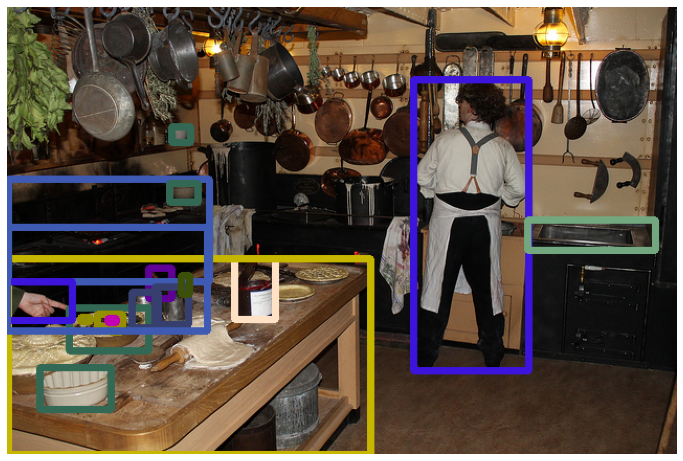

In [111]:
img_id = imgIds[0]
image_path = '/home/theo/Téléchargements/val2017/{}'.format(coco.loadImgs(img_id)[0]['file_name'])
image = cv2.imread(image_path)

annIds = coco.getAnnIds(imgIds=img_id, iscrowd=False)
anns = coco.loadAnns(annIds)

res = image.copy()
target_boxes = [[] for _ in range(len(id_dict))]

for a in anns:
    box = [int(x) for x in coco_to_box(a['bbox'])]
    cat = a['category_id']
    print(box, cat)
    cv2.rectangle(res, box[:2], box[2:], color_dict[cat], 5)
    target_boxes[id_dict[cat]].append(box)
    
plt.figure(figsize=(12, 12))
plt.imshow(res[:, :, ::-1])
plt.axis('off')
#coco.showAnns(anns)
plt.show()

for ic, c in enumerate(target_boxes):
    if len(c) > 0:
        target_boxes[ic] = np.stack(c)

1 (387, 69, 500, 347) 0.78880775
1 (0, 263, 61, 306) 0.69768596
16 (541, 145, 575, 188) 0.31168506
44 (140, 106, 151, 133) 0.3165846
44 (131, 104, 141, 133) 0.30050164
47 (157, 113, 175, 130) 0.34430435
47 (121, 272, 144, 306) 0.32057965
49 (217, 238, 239, 268) 0.45120588
49 (119, 310, 168, 343) 0.31052247
50 (520, 43, 532, 112) 0.62946796
50 (511, 40, 522, 92) 0.5287158
50 (532, 44, 554, 127) 0.49626783
50 (549, 45, 567, 113) 0.41723755
50 (135, 249, 151, 271) 0.34079197
50 (91, 11, 138, 99) 0.3204613
50 (194, 76, 216, 129) 0.30628306
51 (30, 343, 100, 386) 0.794086
51 (155, 169, 183, 185) 0.6831489
51 (58, 288, 136, 328) 0.67698246
51 (62, 62, 123, 129) 0.34722406
64 (0, 1, 62, 141) 0.5116373
67 (0, 233, 348, 421) 0.36785746
79 (233, 191, 373, 313) 0.39264292
79 (488, 201, 618, 339) 0.33394423
79 (1, 191, 193, 296) 0.3325725
81 (497, 204, 612, 229) 0.39459297


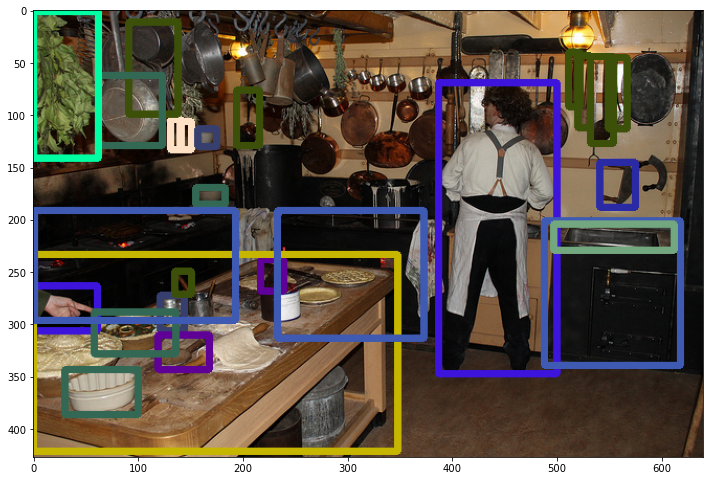

In [112]:
out = inference_detector(model, image)
res = image.copy()
for i, pred in enumerate(out):
    for *box, score in pred:
        if score < 0.3:
            continue
        box = tuple(np.round(box).astype(int).tolist())
        print(id_dict_inv[i], box, score)
        cv2.rectangle(res, box[:2], box[2:], color_dict[id_dict_inv[i]], 5)

plt.figure(figsize=(12, 12))
plt.imshow(res[:, :, ::-1])
plt.show()

In [113]:
saliency_map = generate_saliency_map(image,
                                     n_classes=len(id_dict),
                                     target_boxes=target_boxes,
                                     prob_thresh=0.5,
                                     grid_size=(16, 16),
                                     n_masks=500)

  0%|          | 0/500 [00:00<?, ?it/s]

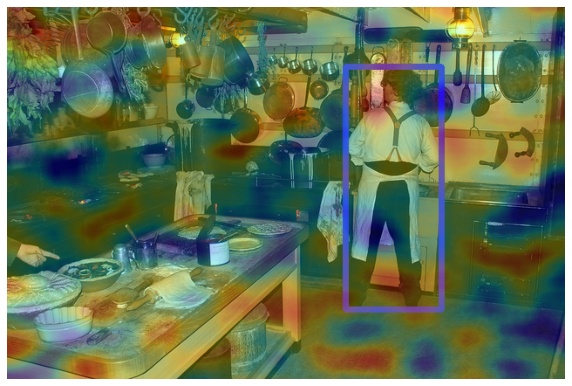

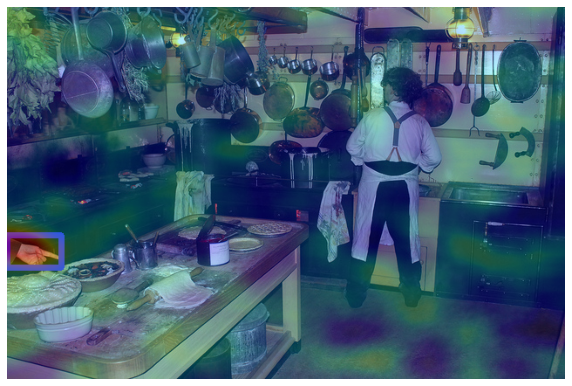

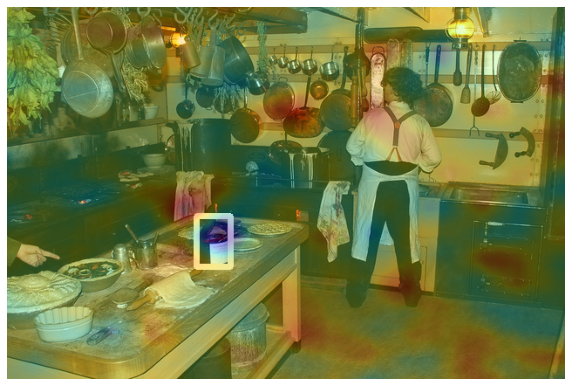

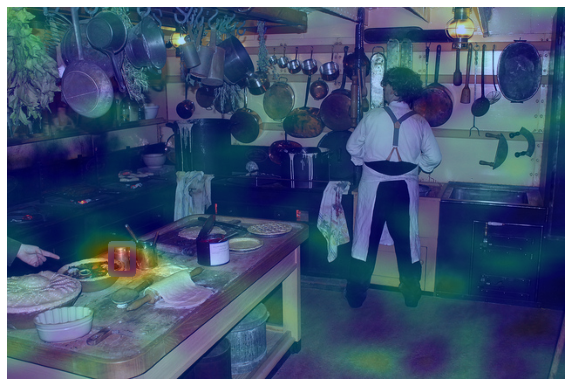

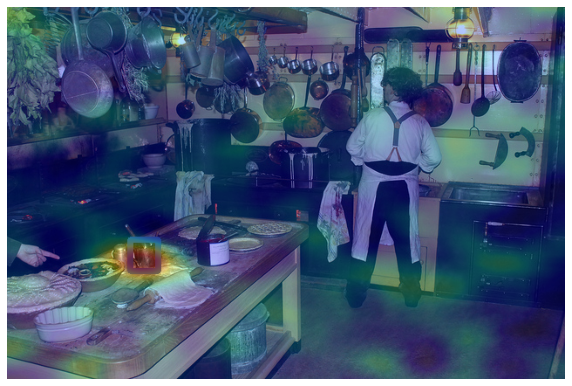

...

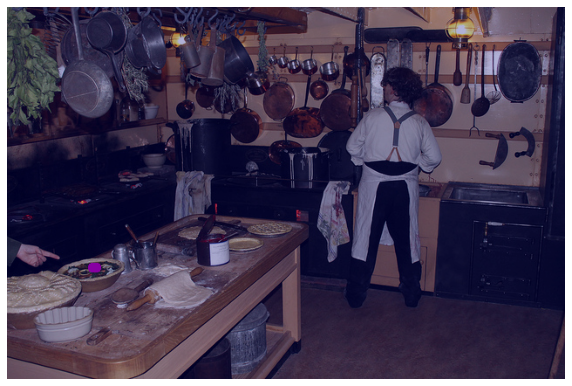

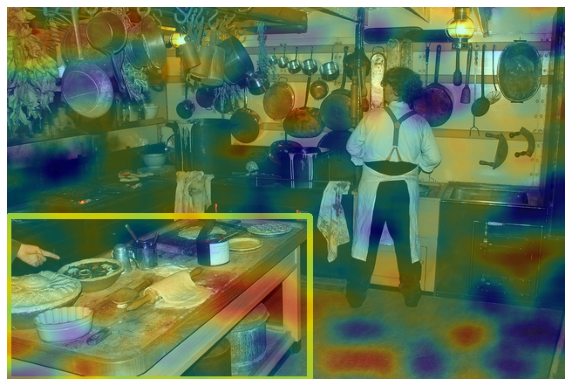

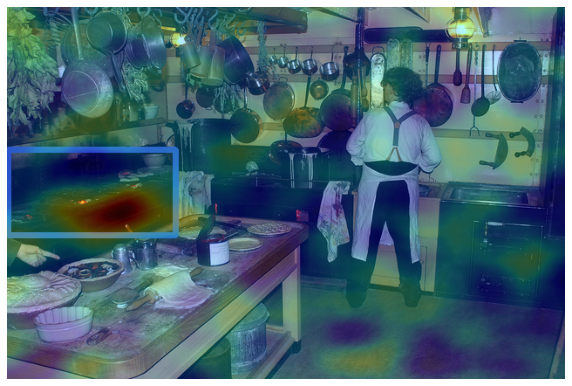

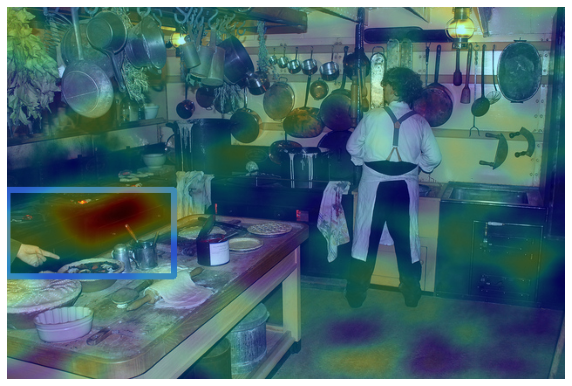

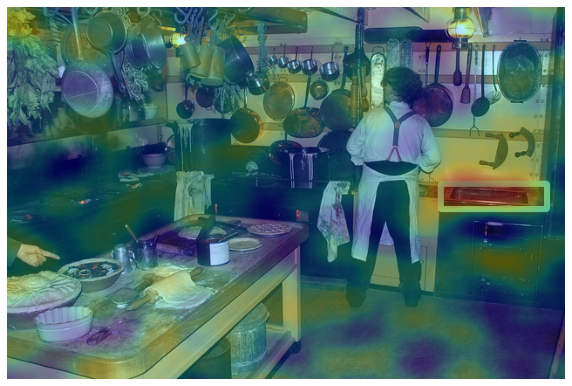

In [114]:
for ic, boxes in enumerate(target_boxes):
    for ib in range(len(boxes)):
        image_with_bbox = image.copy()
        cv2.rectangle(image_with_bbox, tuple(boxes[ib, :2]),
                      tuple(boxes[ib, 2:]), color_dict[id_dict_inv[ic]], 5)

        plt.figure(figsize=(10, 8))
        plt.imshow(image_with_bbox[:, :, ::-1])

        plt.imshow(saliency_map[ic][ib], cmap='jet', alpha=0.3)

        plt.axis('off')
        plt.show()

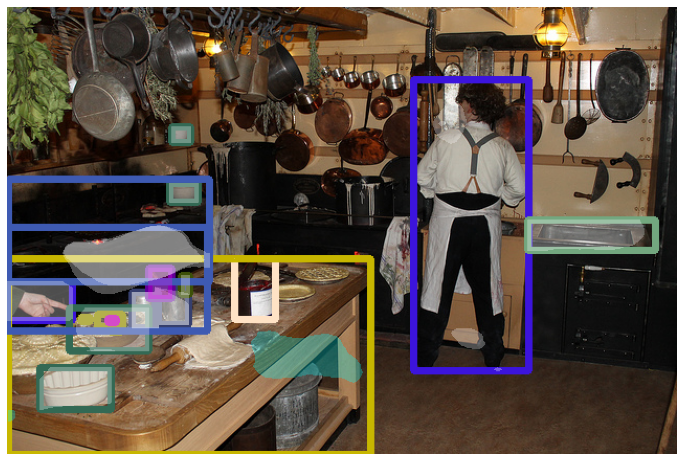

In [115]:
image_with_bbox = image.copy()
for ic in range(len(id_dict)):
    for i in range(len(target_boxes[ic])):
        cv2.rectangle(image_with_bbox, tuple(target_boxes[ic][i,:2]),
                      tuple(target_boxes[ic][i,2:]), color_dict[id_dict_inv[ic]], 5)
        
plt.figure(figsize=(12, 12))
plt.imshow(image_with_bbox[:, :, ::-1])

seg_map = np.zeros((image.shape[0], image.shape[1])) # for annotation file

for ic in range(len(id_dict)):
    if len(target_boxes[ic]) == 0:
        continue

    # keep segmentation map within annotated bboxes
    box_mask = np.full(saliency_map[ic][0].shape, False)
    for x1,y1,x2,y2 in target_boxes[ic]:
        box_mask[y1:y2+1, x1:x2+1] = True

    for ib in range(len(target_boxes[ic])):
        score_mask = saliency_map[ic][ib]>np.percentile(saliency_map[ic][ib], 98)
        segmentation_mask = score_mask & box_mask

        plt.imshow(segmentation_mask, cmap=cmaps[ic], alpha=0.3)
        seg_map = np.where(segmentation_mask, ic+1, seg_map) # for annotation file
    
plt.axis('off')
plt.show()

In [4]:
# Define the classes (out of the 81) which you want to see. Others will not be shown.
filterClasses = ['laptop', 'tv', 'cell phone']

# Fetch class IDs only corresponding to the filterClasses
catIds = coco.getCatIds(catNms=filterClasses) 
# Get all images containing the above Category IDs
#imgIds = coco.getImgIds(catIds=catIds)
imgIds = coco.getImgIds()

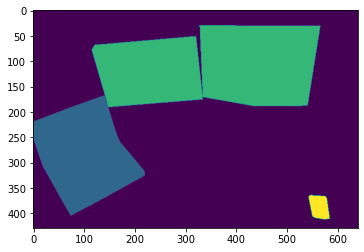

In [9]:
filterClasses = ['laptop', 'tv', 'cell phone']
mask = np.zeros((img['height'],img['width']))
for i in range(len(anns)):
    className = getClassName(anns[i]['category_id'], cats)
    pixel_value = filterClasses.index(className)+1
    mask = np.maximum(coco.annToMask(anns[i])*pixel_value, mask)
plt.imshow(mask)

In [110]:
imgIds

[397133,
 37777,
 252219,
 87038,
 174482,
 403385,
 6818,
 480985,
 458054,
 331352,
 296649,
 386912,
 502136,
 491497,
 184791,
 348881,
 289393,
 522713,
 181666,
 17627,
 143931,
 303818,
 463730,
 460347,
 322864,
 226111,
 153299,
 308394,
 456496,
 58636,
 41888,
 184321,
 565778,
 297343,
 336587,
 122745,
 219578,
 555705,
 443303,
 500663,
 418281,
 25560,
 403817,
 85329,
 329323,
 239274,
 286994,
 511321,
 314294,
 233771,
 475779,
 301867,
 312421,
 185250,
 356427,
 572517,
 270244,
 516316,
 125211,
 562121,
 360661,
 16228,
 382088,
 266409,
 430961,
 80671,
 577539,
 104612,
 476258,
 448365,
 35197,
 349860,
 180135,
 486438,
 400573,
 109798,
 370677,
 238866,
 369370,
 502737,
 515579,
 515445,
 173383,
 438862,
 180560,
 347693,
 39956,
 321214,
 474028,
 66523,
 355257,
 142092,
 63154,
 199551,
 239347,
 514508,
 473237,
 228144,
 206027,
 78915,
 551215,
 544519,
 96493,
 23899,
 340175,
 578500,
 366141,
 57597,
 559842,
 434230,
 428454,
 399462,
 261061,
 1